In [99]:
!pip3 install comet_ml

In [100]:
from comet_ml import Experiment

In [101]:
!pip3 install pandas-profiling

In [102]:
!pip3 install watermark

In [103]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [104]:
experiment = Experiment(api_key="Hidden Area",
                        project_name="CatBoost", workspace="sooner0931",
                        log_env_details=True, log_code=True)

COMET INFO: ---------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     url                   : https://www.comet.ml/sooner0931/catboost/cc131d9fc9f24849989c483476f377a6
COMET INFO:   Uploads:
COMET INFO:     environment details : 1
COMET INFO:     filename            : 1
COMET INFO:     installed packages  : 1
COMET INFO:     os packages         : 1
COMET INFO: ---------------------------
COMET INFO: Experiment is live on comet.ml https://www.comet.ml/sooner0931/catboost/c66d54adef7244a7a7292e000049b129



In [105]:
import numpy as np
import pandas as pd

import pandas_profiling as pp

from sklearn.model_selection import train_test_split
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, make_scorer
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, plot_roc_curve

import xgboost as xgb

import catboost
from catboost import CatBoostClassifier 
from catboost import CatBoostRegressor

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns
import missingno
%matplotlib inline

In [107]:
%load_ext watermark
%watermark --iversions

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
missingno        0.4.2
pandas           1.1.1
seaborn          0.10.0
numpy            1.18.5
pandas_profiling 2.6.0
catboost         0.24
xgboost          1.2.0



In [108]:
df = pd.read_csv('http://biostat.mc.vanderbilt.edu/wiki/pub/Main/DataSets/titanic3.csv')

In [109]:
df.head(3)

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.00,0,0,24160,211.3375,B5,S,2,NaN,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.92,1,2,113781,151.5500,C22 C26,S,11,NaN,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.00,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"


In [110]:
df.shape

(1309, 14)

In [111]:
df.columns

Index(['pclass', 'survived', 'name', 'sex', 'age', 'sibsp', 'parch', 'ticket',
       'fare', 'cabin', 'embarked', 'boat', 'body', 'home.dest'],
      dtype='object')

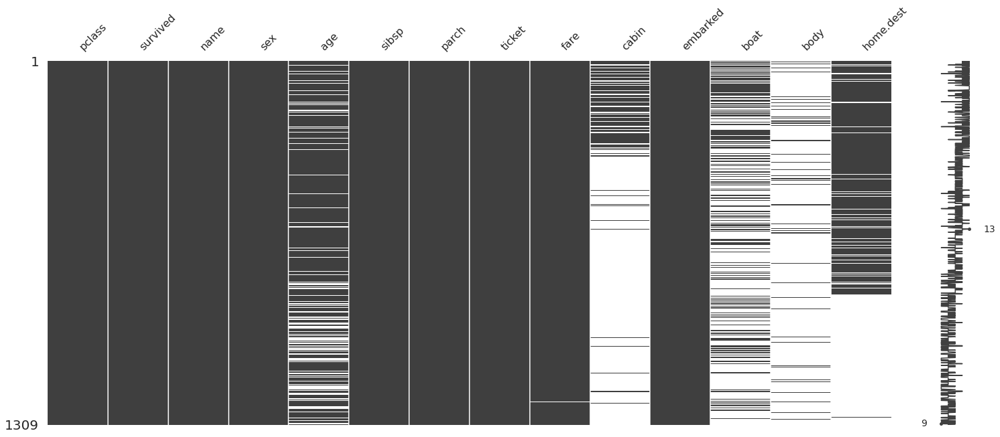

In [112]:
missingno.matrix(df)
plt.show()

In [113]:
df.isna().sum()

pclass          0
survived        0
name            0
sex             0
age           263
sibsp           0
parch           0
ticket          0
fare            1
cabin        1014
embarked        2
boat          823
body         1188
home.dest     564
dtype: int64

In [114]:
df.dtypes

pclass         int64
survived       int64
name          object
sex           object
age          float64
sibsp          int64
parch          int64
ticket        object
fare         float64
cabin         object
embarked      object
boat          object
body         float64
home.dest     object
dtype: object

# CatBoost
The diff from XGBoost is that CatBoost cannot handle NaNs internally, we need to encode that NaNs, whereas XGBoost can handle them.

But CatBoost do not need to transform categoricals into dummies

In [115]:
df.head(3)

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.00,0,0,24160,211.3375,B5,S,2,NaN,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.92,1,2,113781,151.5500,C22 C26,S,11,NaN,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.00,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"


In [116]:
df['cabin'] = df['cabin'].replace(np.NaN, 'U') 
df['cabin'] = [cvalues[0] for cvalues in df['cabin'].values]
df['cabin'] = df['cabin'].replace('U', 'Unknown') 

In [117]:
df['cabin'].unique()

array(['B', 'C', 'E', 'D', 'A', 'Unknown', 'T', 'F', 'G'], dtype=object)

In [118]:
df['is_female'] = np.where(df['sex'] == 'female', 1, 0)

In [119]:
df['is_female'].unique()

array([1, 0])

In [120]:
df.columns

Index(['pclass', 'survived', 'name', 'sex', 'age', 'sibsp', 'parch', 'ticket',
       'fare', 'cabin', 'embarked', 'boat', 'body', 'home.dest', 'is_female'],
      dtype='object')

In [121]:
df = df[[f for f in list(df) if f not in ['sex', 'name', 'boat','body', 'ticket', 'home.dest']]]

In [122]:
df.columns

Index(['pclass', 'survived', 'age', 'sibsp', 'parch', 'fare', 'cabin',
       'embarked', 'is_female'],
      dtype='object')

In [123]:
df['pclass'] = np.where(df['pclass'] == 1, 'First', 
                        np.where(df['pclass'] == 2, 'Second', 
                        'Third'))

In [124]:
df.head(3)

,pclass,survived,age,sibsp,parch,fare,cabin,embarked,is_female
0,First,1,29.00,0,0,211.3375,B,S,1
1,First,1,0.92,1,2,151.5500,C,S,0
2,First,0,2.00,1,2,151.5500,C,S,1


In [125]:
df['pclass'].unique()

array(['First', 'Second', 'Third'], dtype=object)

In [126]:
df['embarked'] = df['embarked'].replace(np.NaN, 'Unknown') 

In [127]:
df['embarked'].unique()

array(['S', 'C', 'Unknown', 'Q'], dtype=object)

In [128]:
df.isna().sum() 

pclass         0
survived       0
age          263
sibsp          0
parch          0
fare           1
cabin          0
embarked       0
is_female      0
dtype: int64

In [129]:
df['age'] = df['age'].fillna(df['age'].mean())

In [130]:
df['age'].isna().sum()

0

In [131]:
SEED = 0

In [132]:
np.where(df.isna())

(array([1225]), array([5]))

In [133]:
df.iloc[1225]

pclass         Third
survived           0
age             60.5
sibsp              0
parch              0
fare             NaN
cabin        Unknown
embarked           S
is_female          0
Name: 1225, dtype: object

In [134]:
titanic_catboost_ready_df = df.dropna()

In [135]:
features = [feat for feat in list(titanic_catboost_ready_df) if feat != 'survived']
print(features)

['pclass', 'age', 'sibsp', 'parch', 'fare', 'cabin', 'embarked', 'is_female']


In [136]:
titanic_categories = np.where(titanic_catboost_ready_df[features].dtypes != np.float)[0]
titanic_categories

array([0, 2, 3, 5, 6, 7])

In [137]:
X_train, X_test, y_train, y_test = train_test_split(df[features], 
                                                    df[['survived']], 
                                                    test_size=0.3, 
                                                    random_state=SEED)

In [138]:
params = {'iterations':5000,
        'learning_rate':0.01,
        'cat_features':titanic_categories,
        'depth':3,
        'eval_metric':'AUC',
        'verbose':200,
        'od_type':"Iter", 
        'od_wait':500, # # overfit-detector(early stopping in XGBoost)
        'random_seed': SEED
        }

In [139]:
cat_model = CatBoostClassifier(**params)

cat_model.fit(X_train, y_train,
              eval_set=(X_test, y_test), 
              use_best_model=True,
              plot=True  
             );

0:	test: 0.8044909	best: 0.8044909 (0)	total: 29.8ms	remaining: 2m 28s


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

200:	test: 0.8421547	best: 0.8421547 (200)	total: 342ms	remaining: 8.17s
400:	test: 0.8483214	best: 0.8483767 (398)	total: 646ms	remaining: 7.41s
600:	test: 0.8506167	best: 0.8506996 (576)	total: 949ms	remaining: 6.95s
800:	test: 0.8516537	best: 0.8521791 (710)	total: 1.31s	remaining: 6.87s
1000:	test: 0.8538383	best: 0.8544605 (927)	total: 1.64s	remaining: 6.56s
1200:	test: 0.8534788	best: 0.8544605 (927)	total: 1.97s	remaining: 6.24s
1400:	test: 0.8547508	best: 0.8547508 (1370)	total: 2.41s	remaining: 6.19s
1600:	test: 0.8550689	best: 0.8552486 (1472)	total: 2.74s	remaining: 5.81s
1800:	test: 0.8544328	best: 0.8552486 (1472)	total: 3.2s	remaining: 5.68s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.8552486035
bestIteration = 1472

Shrink model to first 1473 iterations.


In [140]:
predictions = cat_model.predict(X_test)
predictions

array([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0,

In [141]:
cm = confusion_matrix(y_test, 
                      [1 if p > 0.5 else 0 for p in predictions])

In [142]:
cm

array([[224,  22],
       [ 54,  93]])

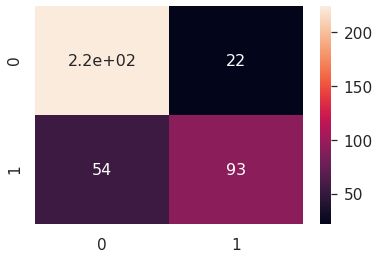

In [143]:
plt.figure(figsize = (6,4))
plt.ticklabel_format(style='plain', axis='y', useOffset=False)
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}) 
plt.show()

In [144]:
cat_model.get_feature_importance()

array([14.21335013,  9.98100341,  7.68401286,  1.85532043, 12.46998867,
        6.92298974,  4.96027344, 41.91306131])

In [145]:
feat_import = [t for t in zip(features, cat_model.get_feature_importance())]

In [146]:
feat_import

[('pclass', 14.213350134430987),
 ('age', 9.981003409467025),
 ('sibsp', 7.684012856854205),
 ('parch', 1.8553204344860652),
 ('fare', 12.469988674251445),
 ('cabin', 6.922989742001067),
 ('embarked', 4.960273436991405),
 ('is_female', 41.91306131151779)]

In [147]:
feat_import_df = pd.DataFrame(feat_import, columns=['Feature', 'VarImp'])
feat_import_df

,Feature,VarImp
0,pclass,14.213350
1,age,9.981003
2,sibsp,7.684013
3,parch,1.855320
4,fare,12.469989
5,cabin,6.922990
6,embarked,4.960273
7,is_female,41.913061


In [148]:
feat_import_df = feat_import_df.sort_values('VarImp', ascending=False)
feat_import_df[feat_import_df['VarImp'] > 0]

,Feature,VarImp
7,is_female,41.913061
0,pclass,14.213350
4,fare,12.469989
1,age,9.981003
2,sibsp,7.684013
5,cabin,6.922990
6,embarked,4.960273
3,parch,1.855320


# XGBoost

In [149]:
df.isna().sum()

pclass       0
survived     0
age          0
sibsp        0
parch        0
fare         1
cabin        0
embarked     0
is_female    0
dtype: int64

In [150]:
def prepare_data_for_model(raw_dataframe, target_columns, drop_first = True, make_na_col = False):
    # dummification: 
    dataframe_dummy = pd.get_dummies(raw_dataframe, 
                                     columns = target_columns, 
                                     drop_first = drop_first, 
                                     dummy_na = make_na_col)
    return (dataframe_dummy)

In [151]:
titanic_xgboost_ready_df = prepare_data_for_model(df, target_columns=['pclass', 'cabin', 'embarked'])

In [152]:
titanic_xgboost_ready_df.isna().sum()

survived            0
age                 0
sibsp               0
parch               0
fare                1
is_female           0
pclass_Second       0
pclass_Third        0
cabin_B             0
cabin_C             0
cabin_D             0
cabin_E             0
cabin_F             0
cabin_G             0
cabin_T             0
cabin_Unknown       0
embarked_Q          0
embarked_S          0
embarked_Unknown    0
dtype: int64

In [153]:
titanic_xgboost_ready_df = titanic_xgboost_ready_df.dropna()
titanic_xgboost_ready_df.isna().sum()

survived            0
age                 0
sibsp               0
parch               0
fare                0
is_female           0
pclass_Second       0
pclass_Third        0
cabin_B             0
cabin_C             0
cabin_D             0
cabin_E             0
cabin_F             0
cabin_G             0
cabin_T             0
cabin_Unknown       0
embarked_Q          0
embarked_S          0
embarked_Unknown    0
dtype: int64

In [154]:
list(titanic_xgboost_ready_df)

['survived',
 'age',
 'sibsp',
 'parch',
 'fare',
 'is_female',
 'pclass_Second',
 'pclass_Third',
 'cabin_B',
 'cabin_C',
 'cabin_D',
 'cabin_E',
 'cabin_F',
 'cabin_G',
 'cabin_T',
 'cabin_Unknown',
 'embarked_Q',
 'embarked_S',
 'embarked_Unknown']

In [155]:
features = [feat for feat in list(titanic_xgboost_ready_df) if feat != 'survived']

In [156]:
X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(titanic_xgboost_ready_df[features], 
                                                                    titanic_xgboost_ready_df[['survived']], 
                                                                    test_size = 0.3, 
                                                                    random_state = SEED)

In [157]:
xgb_params = {
    'max_depth':3, 
    'eta':0.01, 
    'silent':0, 
    'eval_metric':'auc',
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'objective':'binary:logistic',
    'seed' : SEED
    }

In [158]:
train_arr = xgb.DMatrix(X_train_xgb, y_train_xgb, feature_names = X_train_xgb.columns.values)
test_arr = xgb.DMatrix(X_test_xgb, y_test_xgb, feature_names = X_test_xgb.columns.values)

In [159]:
evals = [(train_arr, 'train'), 
         (test_arr,'eval')]

In [160]:
xgb_model = xgb.train ( params = xgb_params,
                        dtrain = train_arr,
                        num_boost_round = 5000,
                        verbose_eval = 200, 
                        early_stopping_rounds = 500,
                        evals = evals,
                        maximize = True)

[11:02:53] WARNING: ../src/learner.cc:516: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-auc:0.84477	eval-auc:0.83004
Multiple eval metrics have been passed: 'eval-auc' will be used for early stopping.

Will train until eval-auc hasn't improved in 500 rounds.
[200]	train-auc:0.89110	eval-auc:0.84408
[400]	train-auc:0.90523	eval-auc:0.84373
Stopping. Best iteration:
[11]	train-auc:0.87013	eval-auc:0.84641



In [161]:
xgb_fea_imp = pd.DataFrame(list(xgb_model.get_fscore().items()),
                           columns=['feature','importance']).sort_values('importance', ascending=False)

In [162]:
xgb_fea_imp.head(10)

,feature,importance
5,fare,1061
6,age,765
0,is_female,319
7,sibsp,310
4,pclass_Third,235
1,cabin_Unknown,175
8,embarked_S,142
3,parch,104
2,cabin_C,91
10,pclass_Second,39


In [163]:
predictions = xgb_model.predict(test_arr)
predictions[:10]

array([0.6787986 , 0.18374892, 0.09642234, 0.67623854, 0.09402861,
       0.12735146, 0.35832173, 0.23428206, 0.12355588, 0.08823425],
      dtype=float32)

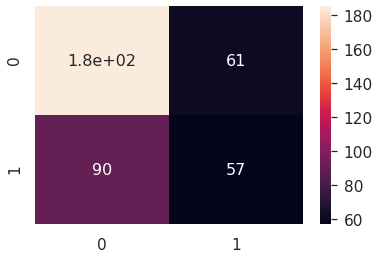

In [164]:
cm = confusion_matrix(y_test, [1 if p > 0.5 else 0 for p in predictions])

plt.figure(figsize = (6,4))
plt.ticklabel_format(style='plain', axis='y', useOffset=False)
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}) 
plt.show()

In [165]:
xgb_model.best_score

0.846408

In [166]:
cat_model.best_score_

{'learn': {'Logloss': 0.3532502018609263},
 'validation': {'Logloss': 0.4243752925903596, 'AUC': 0.8552486035064433}}

# CatBoost Classifier & Regressor

In [167]:
from catboost.datasets import titanic

In [168]:
type(titanic)

function

In [169]:
titanic

<function catboost.datasets.titanic()>

In [170]:
titanic_train, titanic_test = titanic()

In [171]:
titanic_train.shape

(891, 12)

In [172]:
titanic_test.shape

(418, 11)

In [173]:
titanic_train.head(3)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


In [174]:
titanic_train.dtypes

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

In [175]:
from IPython.display import IFrame

In [176]:
pp.ProfileReport(titanic_train)

### Regressor

In [177]:
from sklearn.datasets import load_boston

In [178]:
boston_dataset = load_boston()
boston_dataset.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [179]:
for i in boston_dataset.DESCR.split('\n'):
    print(i)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [180]:
boston = pd.DataFrame(boston_dataset.data, 
                      columns = boston_dataset.feature_names)

In [181]:
boston.head(3)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03


In [182]:
boston.shape

(506, 13)

In [183]:
boston.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT'],
      dtype='object')

In [184]:
boston.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD        float64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
dtype: object

In [185]:
boston['Median_Val'] = boston_dataset.target
boston.head(3)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Median_Val
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7


In [186]:
pp.ProfileReport(boston)

In [187]:
boston.isna().sum()

CRIM          0
ZN            0
INDUS         0
CHAS          0
NOX           0
RM            0
AGE           0
DIS           0
RAD           0
TAX           0
PTRATIO       0
B             0
LSTAT         0
Median_Val    0
dtype: int64

In [188]:
outome_name = 'Median_Val'

features_for_model = [f for f in list(boston) if f not in [outome_name, 'TAX']]

In [189]:
boston_categories = np.where([boston[f].apply(float.is_integer).all() for f in features_for_model])[0]

print('boston_categories:', boston_categories)

boston_categories: [3 8]


In [190]:
for feature in [list(boston[features_for_model])[f] for f in list(boston_categories)]:
    print(feature)
    boston[feature] = boston[feature].to_string()

CHAS
RAD


In [191]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(boston[features_for_model], 
                                                    boston[outome_name], 
                                                    test_size = 0.3, 
                                                    random_state = 1)

In [192]:
params = {'iterations':10000,
        'learning_rate':0.001,
        'depth':3,
        'loss_function':'RMSE',
        'eval_metric':'RMSE',
        'random_seed':55,
        'cat_features':boston_categories,
        'metric_period':200,  
        'od_type':"Iter",  
        'od_wait':20,  
        'verbose':True,
        'use_best_model':True}

In [193]:
cat_regressor = CatBoostRegressor(**params)

cat_regressor.fit(X_train,
                  y_train, 
                  eval_set = (X_test, y_test),  
                  use_best_model=True,  
                  plot= True   
                  ) 

0:	learn: 9.0053157	test: 9.5900524	best: 9.5900524 (0)	total: 5.19ms	remaining: 51.9s


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

200:	learn: 8.1074965	test: 8.6687770	best: 8.6687770 (200)	total: 145ms	remaining: 7.05s
400:	learn: 7.3687093	test: 7.9087080	best: 7.9087080 (400)	total: 272ms	remaining: 6.51s
600:	learn: 6.7366439	test: 7.2525600	best: 7.2525600 (600)	total: 400ms	remaining: 6.25s
800:	learn: 6.1968068	test: 6.6786314	best: 6.6786314 (800)	total: 500ms	remaining: 5.75s
1000:	learn: 5.7434878	test: 6.1855299	best: 6.1855299 (1000)	total: 605ms	remaining: 5.44s
1200:	learn: 5.3655864	test: 5.7759896	best: 5.7759896 (1200)	total: 711ms	remaining: 5.21s
1400:	learn: 5.0453542	test: 5.4259099	best: 5.4259099 (1400)	total: 820ms	remaining: 5.03s
1600:	learn: 4.7674610	test: 5.1112594	best: 5.1112594 (1600)	total: 952ms	remaining: 4.99s
1800:	learn: 4.5332065	test: 4.8463072	best: 4.8463072 (1800)	total: 1.06s	remaining: 4.84s
2000:	learn: 4.3267454	test: 4.6250683	best: 4.6250683 (2000)	total: 1.18s	remaining: 4.7s
2200:	learn: 4.1476719	test: 4.4341984	best: 4.4341984 (2200)	total: 1.29s	remaining: 4.5

In [194]:
feat_import = [t for t in zip(features_for_model, cat_regressor.get_feature_importance())]
feat_import_df = pd.DataFrame(feat_import, columns = ['Feature', 'VarImp'])
feat_import_df = feat_import_df.sort_values('VarImp', ascending=False)
feat_import_df.head(20)

,Feature,VarImp
11,LSTAT,42.287958
5,RM,25.580920
7,DIS,9.319714
4,NOX,5.988686
9,PTRATIO,4.859116
0,CRIM,4.728355
6,AGE,2.564012
10,B,2.334989
2,INDUS,2.125478
1,ZN,0.210772
